### Sex Ratio By Last Name (Part II: Process and Analysis)

Indian names are famously complicated. To infer last names, we create rules that lead us to make fewer false positives than negatives.

Here's the algorithm we use:

1. Start with `base_df`. (From Part I)

2. Filter to households with a non-missing household number and take out households with house size > 20. Store the data frame as `last_name_hh_no_df`.

3. Among households with more than one person, filter to last words shared by two or more people. Store these names in a list called `potential_last_names`.

4. Go to the `base_df` and assign `potential_last_name` to any name that matches our list. Subset on `potential_last_name` that is shared by at least 1000 households and create a list called `likely_last_name`.

5. Calculate sex-ratio by `likely_last_name` using `base_df`and filter out names where the sex ratio is over 3 or under .5 assuming that these ratios map to first names than last names. Store the list under `likely_last_name_sex_ratio_test.` (Here's a [list of names](data/potential_last_names_with_unlikely_sex_ratios.csv) that we filter as a result of this requirement.)

6. Go back to `base_df` and create a column called `best_guess_last_name` that matches any name in the `likely_last_name_sex_ratio_test.`

In [1]:
import pandas as pd


In [2]:
%%time

orig_df = pd.read_csv('in_rolls_last_sex.tar.gz')
orig_df

<decorator-gen-54>:2: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.


CPU times: user 6min 33s, sys: 38.2 s, total: 7min 12s
Wall time: 7min 12s


,elector_name,house_no,age,sex,state,birth_year,last_name
0,pintu datta,-,38,male,andaman,1979,datta
1,sushila devi,-,39,female,andaman,1978,devi
2,bala krishna,-,29,male,andaman,1988,krishna
3,chandra sekhar,-,45,male,andaman,1972,sekhar
4,marianus toppo,-,47,male,andaman,1970,toppo
...,...,...,...,...,...,...,...
402376381,vivek chandr chouhaan,614.0,34,male,uttarakhand,1984,chouhaan
402376382,renoo chouhaan,614.0,31,female,uttarakhand,1987,chouhaan
402376383,abhinav kumaar,614.0,31,male,uttarakhand,1987,kumaar
402376384,priyamkaa raanee,614.0,30,female,uttarakhand,1988,raanee


In [3]:
last_name_hh_no_df = orig_df.copy()

In [4]:
# Take out null house_no
last_name_hh_no_df.dropna(subset=['house_no'], inplace=True)
last_name_hh_no_df.drop(last_name_hh_no_df[last_name_hh_no_df.house_no.isin(['-', '0'])].index, inplace=True)
last_name_hh_no_df

,elector_name,house_no,age,sex,state,birth_year,last_name
81,erobin kerketta,00,34,male,andaman,1983,kerketta
82,b keshav rao,00,53,male,andaman,1964,rao
83,ashnia dayasagar,00,26,female,andaman,1991,dayasagar
84,lal sai ekka,00,43,male,andaman,1974,ekka
85,jagat ram,00,36,male,andaman,1981,ram
...,...,...,...,...,...,...,...
402376381,vivek chandr chouhaan,614.0,34,male,uttarakhand,1984,chouhaan
402376382,renoo chouhaan,614.0,31,female,uttarakhand,1987,chouhaan
402376383,abhinav kumaar,614.0,31,male,uttarakhand,1987,kumaar
402376384,priyamkaa raanee,614.0,30,female,uttarakhand,1988,raanee


In [5]:
last_name_hh_no_df['house_id'] = (last_name_hh_no_df.house_no != last_name_hh_no_df.house_no.shift()).cumsum()
last_name_hh_no_df

,elector_name,house_no,age,sex,state,birth_year,last_name,house_id
81,erobin kerketta,00,34,male,andaman,1983,kerketta,1
82,b keshav rao,00,53,male,andaman,1964,rao,1
83,ashnia dayasagar,00,26,female,andaman,1991,dayasagar,1
84,lal sai ekka,00,43,male,andaman,1974,ekka,1
85,jagat ram,00,36,male,andaman,1981,ram,1
...,...,...,...,...,...,...,...,...
402376381,vivek chandr chouhaan,614.0,34,male,uttarakhand,1984,chouhaan,146113045
402376382,renoo chouhaan,614.0,31,female,uttarakhand,1987,chouhaan,146113045
402376383,abhinav kumaar,614.0,31,male,uttarakhand,1987,kumaar,146113045
402376384,priyamkaa raanee,614.0,30,female,uttarakhand,1988,raanee,146113045


In [6]:
%%time
gfilter = last_name_hh_no_df.groupby(['house_id'])['house_id'].transform('count').le(20)
last_name_hh_no_df = last_name_hh_no_df[gfilter]
last_name_hh_no_df

CPU times: user 54.6 s, sys: 25.4 s, total: 1min 19s
Wall time: 1min 20s


,elector_name,house_no,age,sex,state,birth_year,last_name,house_id
106,sapan mondal,063,39,male,andaman,1978,mondal,2
107,ramesh kumar,109,26,male,andaman,1991,kumar,3
108,savitri devi,150,39,female,andaman,1978,devi,4
109,ratan halder,150,38,male,andaman,1979,halder,4
110,supriya mondal,161,30,female,andaman,1987,mondal,5
...,...,...,...,...,...,...,...,...
402376381,vivek chandr chouhaan,614.0,34,male,uttarakhand,1984,chouhaan,146113045
402376382,renoo chouhaan,614.0,31,female,uttarakhand,1987,chouhaan,146113045
402376383,abhinav kumaar,614.0,31,male,uttarakhand,1987,kumaar,146113045
402376384,priyamkaa raanee,614.0,30,female,uttarakhand,1988,raanee,146113045


In [7]:
%%time
gfilter = last_name_hh_no_df.groupby(['house_id', 'last_name'])['last_name'].transform('count').gt(1)
potential_last_names = last_name_hh_no_df[gfilter].last_name.unique()
len(potential_last_names), potential_last_names

CPU times: user 4min 34s, sys: 1min 18s, total: 5min 53s
Wall time: 5min 53s


(490957,
 array(['mondal', 'minj', 'ekka', ..., 'barakootee', 'phikaal', 'laavad'],
       dtype=object))

In [8]:
import gc

del last_name_hh_no_df
gc.collect()

212

In [9]:
base_df = orig_df.copy()

In [10]:
base_df['potential_last_name'] = base_df['last_name']
base_df.loc[~base_df.last_name.isin(potential_last_names), 'potential_last_name'] = None
base_df

,elector_name,house_no,age,sex,state,birth_year,last_name,potential_last_name
0,pintu datta,-,38,male,andaman,1979,datta,datta
1,sushila devi,-,39,female,andaman,1978,devi,devi
2,bala krishna,-,29,male,andaman,1988,krishna,krishna
3,chandra sekhar,-,45,male,andaman,1972,sekhar,sekhar
4,marianus toppo,-,47,male,andaman,1970,toppo,toppo
...,...,...,...,...,...,...,...,...
402376381,vivek chandr chouhaan,614.0,34,male,uttarakhand,1984,chouhaan,chouhaan
402376382,renoo chouhaan,614.0,31,female,uttarakhand,1987,chouhaan,chouhaan
402376383,abhinav kumaar,614.0,31,male,uttarakhand,1987,kumaar,kumaar
402376384,priyamkaa raanee,614.0,30,female,uttarakhand,1988,raanee,raanee


In [11]:
%%time
gfilter = base_df.groupby(['potential_last_name'])['potential_last_name'].transform('count').gt(2000)
likely_last_names = base_df[gfilter].potential_last_name.unique()
len(likely_last_names), likely_last_names

CPU times: user 1min 56s, sys: 42.3 s, total: 2min 38s
Wall time: 2min 38s


(11203,
 array(['datta', 'devi', 'krishna', ..., 'sthththth', 'thththkph',
        'thththphphak'], dtype=object))

### NOTE: if filter by X = 1,000
```
CPU times: user 1min 44s, sys: 35.4 s, total: 2min 19s
Wall time: 2min 19s
(18681,
 array(['datta', 'devi', 'krishna', ..., 'sthththth', 'thththkph',
        'thththphphak'], dtype=object))
```

In [12]:
base_df['likely_last_name'] = base_df['last_name']
base_df.loc[~base_df.last_name.isin(likely_last_names), 'likely_last_name'] = None
base_df

,elector_name,house_no,age,sex,state,birth_year,last_name,potential_last_name,likely_last_name
0,pintu datta,-,38,male,andaman,1979,datta,datta,datta
1,sushila devi,-,39,female,andaman,1978,devi,devi,devi
2,bala krishna,-,29,male,andaman,1988,krishna,krishna,krishna
3,chandra sekhar,-,45,male,andaman,1972,sekhar,sekhar,sekhar
4,marianus toppo,-,47,male,andaman,1970,toppo,toppo,toppo
...,...,...,...,...,...,...,...,...,...
402376381,vivek chandr chouhaan,614.0,34,male,uttarakhand,1984,chouhaan,chouhaan,chouhaan
402376382,renoo chouhaan,614.0,31,female,uttarakhand,1987,chouhaan,chouhaan,chouhaan
402376383,abhinav kumaar,614.0,31,male,uttarakhand,1987,kumaar,kumaar,kumaar
402376384,priyamkaa raanee,614.0,30,female,uttarakhand,1988,raanee,raanee,raanee


In [13]:
count_df = base_df.groupby(['likely_last_name'])['sex'].value_counts().unstack()
count_df['sex_ratio'] = count_df['male'] / count_df['female']
count_df

sex,female,male,sex_ratio
likely_last_name,,,
aa,3222.0,9582.0,2.973929
aaa,324.0,1984.0,6.123457
aaambaadaas,1733.0,4658.0,2.687825
aaamboo,1746.0,3229.0,1.849370
aaamnad,1111.0,1198.0,1.078308
...,...,...,...
yusuf,154.0,2117.0,13.746753
yusuph,21541.0,43726.0,2.029896
yusuphabhaai,1.0,4486.0,4486.000000


In [14]:
likely_last_name_sex_ratio_test = list(count_df[count_df.sex_ratio.between(0.5, 1.5)].index)
likely_last_name_sex_ratio_test

['aaamnad',
 'aaamnadaa',
 'aabaasoo',
 'aabhaa',
 'aachaaree',
 'aachaari',
 'aachaaryy',
 'aachaay',
 'aachaaya',
 'aachaayea',
 'aades',
 'aadi',
 'aadivaasee',
 'aaeend',
 'aahajaa',
 'aahake',
 'aahoojaa',
 'aahujaa',
 'aajabamsee',
 'aajhhaad',
 'aakula',
 'aala',
 'aalagura',
 'aalura',
 'aambi',
 'aambigera',
 'aamgad',
 'aamgadi',
 'aamgariyaa',
 'aamkalagi',
 'aamkoos',
 'aamkus',
 'aamthoon',
 'aamthoonee',
 'aanamd',
 'aanamdaa',
 'aanamth',
 'aanamthaa',
 'aapata',
 'aar',
 'aaryaa',
 'aasamgi',
 'aasook',
 'aavula',
 'aay',
 'aayub',
 'abburi',
 'abdool',
 'abdul',
 'abhay',
 'abraaham',
 'abraham',
 'achanta',
 'achumi',
 'achyuth',
 'adabala',
 'adapa',
 'adari',
 'addala',
 'addanki',
 'addepalli',
 'adduri',
 'adhaa',
 'adhik',
 'adhikaaree',
 'adhikari',
 'adigarla',
 'adimulam',
 'adpa',
 'agaravaal',
 'agarwal',
 'agasara',
 'aggarwal',
 'agnihoothree',
 'agrahari',
 'agranjchaala',
 'agranjchaalaa',
 'agranjjaala',
 'agravaal',
 'agrawal',
 'aharavaar',
 'ahiravaa

In [15]:
base_df['best_guess_last_name'] = base_df['last_name']
base_df.loc[~base_df.last_name.isin(likely_last_name_sex_ratio_test), 'best_guess_last_name'] = None
base_df

,elector_name,house_no,age,sex,state,birth_year,last_name,potential_last_name,likely_last_name,best_guess_last_name
0,pintu datta,-,38,male,andaman,1979,datta,datta,datta,datta
1,sushila devi,-,39,female,andaman,1978,devi,devi,devi,None
2,bala krishna,-,29,male,andaman,1988,krishna,krishna,krishna,None
3,chandra sekhar,-,45,male,andaman,1972,sekhar,sekhar,sekhar,None
4,marianus toppo,-,47,male,andaman,1970,toppo,toppo,toppo,toppo
...,...,...,...,...,...,...,...,...,...,...
402376381,vivek chandr chouhaan,614.0,34,male,uttarakhand,1984,chouhaan,chouhaan,chouhaan,None
402376382,renoo chouhaan,614.0,31,female,uttarakhand,1987,chouhaan,chouhaan,chouhaan,None
402376383,abhinav kumaar,614.0,31,male,uttarakhand,1987,kumaar,kumaar,kumaar,None
402376384,priyamkaa raanee,614.0,30,female,uttarakhand,1988,raanee,raanee,raanee,None


In [16]:
#base_df.to_csv('in_rolls_state_name_age_sex_best_guess_last_name.csv.gz', index=False, compression='gzip')

In [17]:
base_df.groupby(['state']).size()

state
andaman          174424
andhra         23579875
arunachal        711419
assam           6666684
bihar          68017277
chandigarh       454323
dadra            155817
daman            114722
delhi           9303194
goa             1043551
gujarat        23671318
haryana         8378098
himachal        3756424
jharkhand      20978847
jk               152231
karnataka       6550348
kerala          4428460
maharastra     81367250
manipur         1389251
meghalaya       1706288
mizoram          254154
mp             14607636
nagaland         248457
odisha         31077140
puducherry       128195
punjab         16785917
rajasthan      13644360
sikkim           355751
tripura         2393876
up             55383936
uttarakhand     4897163
dtype: int64

In [18]:
%%time
import gzip

with gzip.open('last_name_failed_sex_ratio.txt.gz', 'wb') as f:
    f.write('\n'.join(base_df[base_df.best_guess_last_name.isnull()].last_name.dropna().unique()).encode('utf-8'))
with gzip.open('best_guess_last_name.txt.gz', 'wb') as f:
    f.write('\n'.join(base_df[base_df.best_guess_last_name.notnull()].best_guess_last_name.dropna().unique()).encode('utf-8'))

CPU times: user 2min 18s, sys: 56.4 s, total: 3min 15s
Wall time: 3min 15s


### Analysis

Group `orig_df` by `birth_year`. Filter to years with more than 10,000 records. Plot.

Filter `base_df` to names with more than 10,000 records. Group the filtered dataset by `best_guess_last_name` and produce dataset with four columns `last_name, n_male, n_female, sex_ratio` and store as [sex_ratio_by_last_name](data/sex_ratio_by_last_name.csv).

The top 50 most imbalanced ratios are plotted below.

Group `base_df`by `best_guess_last_name` and `birth_year`. Filter the dataset to names with at least 500 records in at least 25 years. Output the dataset with five columns `last_name, birth_year, n_male, n_female, sex_ratio` and store as [sex_ratio_by_last_name](data/sex_ratio_by_last_name.csv).

We plot this here.

We then estimate a linear regression: `sex_ratio ~ birth_year + best_guess_last_name + e` using this [data](data/sex_ratio_by_last_name.csv)

<AxesSubplot:xlabel='birth_year'>

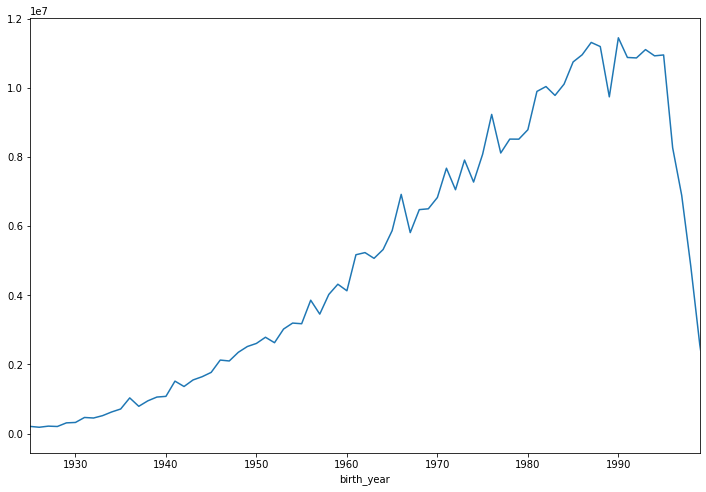

In [19]:
gfilter = orig_df.groupby('birth_year')['birth_year'].transform('count').gt(10000)
orig_df[gfilter].groupby('birth_year')['birth_year'].count().plot(figsize=(12, 8), xlim = (1925, 1999))

In [20]:
del orig_df
gc.collect()

32

In [21]:
gfilter = base_df.groupby('best_guess_last_name')['best_guess_last_name'].transform('count').gt(10000)
filtered_base_df = base_df[gfilter]
filtered_base_df

,elector_name,house_no,age,sex,state,birth_year,last_name,potential_last_name,likely_last_name,best_guess_last_name
16,ram shundar sharma,-,27,male,andaman,1990,sharma,sharma,sharma,sharma
33,sunil thomas,-,50,male,andaman,1967,thomas,thomas,thomas,thomas
35,bipul mondal,-,39,male,andaman,1978,mondal,mondal,mondal,mondal
41,pradeep biswas,-,25,male,andaman,1992,biswas,biswas,biswas,biswas
43,sushma mejhren kujur,-,43,female,andaman,1974,kujur,kujur,kujur,kujur
...,...,...,...,...,...,...,...,...,...,...
402376048,dines dathth adhikaaree,217.0,19,male,uttarakhand,1999,adhikaaree,adhikaaree,adhikaaree,adhikaaree
402376096,rekhaa adhikaaree,256.0,24,female,uttarakhand,1994,adhikaaree,adhikaaree,adhikaaree,adhikaaree
402376097,narendr dathth adhikaaree,256.0,19,male,uttarakhand,1999,adhikaaree,adhikaaree,adhikaaree,adhikaaree
402376172,madan moohan,471.0,43,male,uttarakhand,1975,moohan,moohan,moohan,moohan


<AxesSubplot:xlabel='birth_year'>

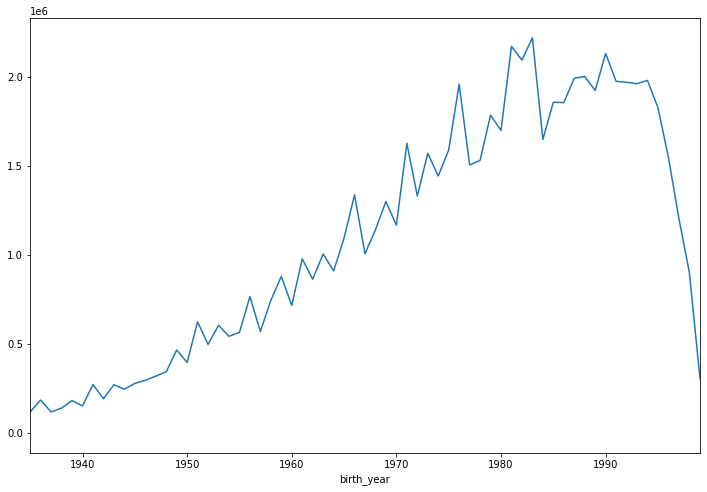

In [22]:
filtered_base_df.groupby('birth_year')['birth_year'].count().plot(figsize=(12, 8), xlim = (1935, 1999))

In [23]:
sex_ratio_by_last_name_df = filtered_base_df.groupby(['last_name'])['sex'].value_counts().unstack()
sex_ratio_by_last_name_df['sex_ratio'] = sex_ratio_by_last_name_df['male'] / sex_ratio_by_last_name_df['female']
sex_ratio_by_last_name_df

sex,female,male,sex_ratio
last_name,,,
aabhaa,45216,57837,1.279127
aachaaryy,7309,8522,1.165960
aachaaya,7024,5696,0.810934
aadivaasee,5005,7143,1.427173
aajabamsee,8342,9172,1.099497
...,...,...,...
yasavamth,102528,145698,1.421056
yenaa,142452,125467,0.880767
yooges,65947,47142,0.714847


In [24]:
sex_ratio_by_last_name_df.to_csv('sex_ratio_by_last_name.csv', index_label='last_name')

### The top 50 most imbalanced ratios are plotted below.

In [25]:
top50_sex_ratio_df = sex_ratio_by_last_name_df.reset_index().sort_values('sex_ratio', ascending=False)[:50]
top50_sex_ratio_df

sex,last_name,female,male,sex_ratio
189,chari,4873,7299,1.497845
394,isaak,9441,14130,1.496663
685,naaseer,4920,7338,1.491463
261,dilaavar,4181,6235,1.491270
211,daamoo,14353,21389,1.490211
132,bhagavamth,4059,6046,1.489529
981,soomanaath,36176,53850,1.488556
403,jaatav,14986,22281,1.486788
105,bansee,13146,19543,1.486612
1011,sukhadev,43007,63907,1.485967


In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

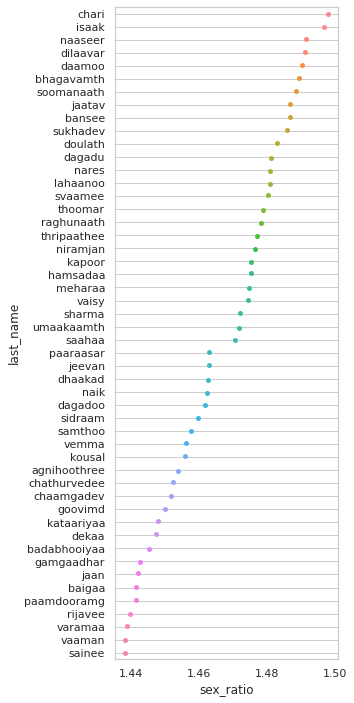

In [27]:
plt.figure(figsize=(4, 12))
g = sns.stripplot(x='sex_ratio', y='last_name', data=top50_sex_ratio_df)
ax = g.axes
ax.xaxis.grid(False)
ax.yaxis.grid(True)

In [28]:
gfilter = base_df.groupby(['best_guess_last_name', 'birth_year'])['birth_year'].transform('count').gt(500)
filtered_base_df = base_df[gfilter]
filtered_base_df

,elector_name,house_no,age,sex,state,birth_year,last_name,potential_last_name,likely_last_name,best_guess_last_name
16,ram shundar sharma,-,27,male,andaman,1990,sharma,sharma,sharma,sharma
33,sunil thomas,-,50,male,andaman,1967,thomas,thomas,thomas,thomas
43,sushma mejhren kujur,-,43,female,andaman,1974,kujur,kujur,kujur,kujur
52,akhilesh sharma,-,28,male,andaman,1989,sharma,sharma,sharma,sharma
58,pandya rajan,-,28,male,andaman,1989,rajan,rajan,rajan,rajan
...,...,...,...,...,...,...,...,...,...,...
402375991,raahul negee,150.0,22,male,uttarakhand,1996,negee,negee,negee,negee
402376015,lalith moohan,179.0,32,male,uttarakhand,1986,moohan,moohan,moohan,moohan
402376096,rekhaa adhikaaree,256.0,24,female,uttarakhand,1994,adhikaaree,adhikaaree,adhikaaree,adhikaaree
402376172,madan moohan,471.0,43,male,uttarakhand,1975,moohan,moohan,moohan,moohan


In [29]:
sex_ratio_by_last_name_birth_year_df = filtered_base_df.groupby(['last_name', 'birth_year'])['sex'].value_counts().unstack()
sex_ratio_by_last_name_birth_year_df['sex_ratio'] = sex_ratio_by_last_name_birth_year_df['male'] / sex_ratio_by_last_name_birth_year_df['female']
sex_ratio_by_last_name_birth_year_df

sex                   female    male  sex_ratio
last_name birth_year                           
aabhaa    1940         168.0   467.0   2.779762
          1945         277.0   392.0   1.415162
          1950         431.0   386.0   0.895592
          1953         322.0   357.0   1.108696
          1955         557.0   530.0   0.951526
...                      ...     ...        ...
yuvaraaj  1995         931.0  1163.0   1.249194
          1996         689.0   974.0   1.413643
          1997         367.0   685.0   1.866485
          1998         659.0   634.0   0.962064
          2016         351.0   291.0   0.829060

[26299 rows x 3 columns]

In [30]:
# V2: Take out sex ratio over than 4
todrop = sex_ratio_by_last_name_birth_year_df[sex_ratio_by_last_name_birth_year_df.sex_ratio > 4].index
sex_ratio_by_last_name_birth_year_df.drop(todrop, inplace=True)
sex_ratio_by_last_name_birth_year_df

sex                   female    male  sex_ratio
last_name birth_year                           
aabhaa    1940         168.0   467.0   2.779762
          1945         277.0   392.0   1.415162
          1950         431.0   386.0   0.895592
          1953         322.0   357.0   1.108696
          1955         557.0   530.0   0.951526
...                      ...     ...        ...
yuvaraaj  1995         931.0  1163.0   1.249194
          1996         689.0   974.0   1.413643
          1997         367.0   685.0   1.866485
          1998         659.0   634.0   0.962064
          2016         351.0   291.0   0.829060

[26098 rows x 3 columns]

In [31]:
adf = sex_ratio_by_last_name_birth_year_df.unstack()['sex_ratio']
adf

birth_year,1923,1925,1926,1927,1928,1929,1930,1931,1932,1933,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2020
last_name,,,,,,,,,,,,,,,,,,,,,
aabhaa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aadivaasee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aajabamsee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aakula,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aamgad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yasavamth,NaN,NaN,NaN,NaN,NaN,0.977199,NaN,1.391156,1.068404,1.388889,...,NaN,NaN,1.388316,0.553254,2.643275,NaN,1.205607,NaN,2.314741,NaN
yenaa,NaN,0.098916,NaN,NaN,NaN,NaN,NaN,1.097826,NaN,1.030405,...,NaN,NaN,NaN,0.158163,NaN,NaN,NaN,0.356322,NaN,NaN
yooges,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.247628,NaN,NaN,NaN


In [32]:
# only keep last names where we have data for at least 25 years
last_names_25y = list(adf[adf.count(axis=1) >= 25].index)
last_names_25y

['aabhaa',
 'aamkus',
 'aanamd',
 'aanamdaa',
 'abdul',
 'aggarwal',
 'agravaal',
 'ahiravaar',
 'ajay',
 'ajith',
 'amith',
 'amool',
 'amrith',
 'anamth',
 'anamthaa',
 'anil',
 'aravimd',
 'arjun',
 'aroodaa',
 'aroon',
 'arun',
 'asook',
 'athul',
 'baa',
 'baabaasoo',
 'baaga',
 'baagha',
 'baalaasoo',
 'baaloo',
 'baalu',
 'baapoo',
 'baapu',
 'baarika',
 'baban',
 'badabhooiyaa',
 'badigera',
 'badoo',
 'baisy',
 'bajaramg',
 'balavamth',
 'bamdoo',
 'bamdu',
 'bamsal',
 'bandaru',
 'bandi',
 'bansal',
 'bansee',
 'barihaa',
 'barman',
 'basumathaaee',
 'bathula',
 'beheraa',
 'besaraa',
 'bhaagavath',
 'bhaalachamdr',
 'bhaarath',
 'bhaarathee',
 'bhaaskar',
 'bhajamthri',
 'bharath',
 'bhimaa',
 'bhooia',
 'bhoumik',
 'bhuea',
 'bhuyaa',
 'biraadaara',
 'bisbaala',
 'bisht',
 'bisvaala',
 'boddu',
 'chaakamaa',
 'chakma',
 'chakrabarthee',
 'challa',
 'chamdrakaamth',
 'chathurvedee',
 'chavhaana',
 'chettri',
 'chhagan',
 'choudhuree',
 'daadaa',
 'daakuaaa',
 'daamoo',
 'daa

In [33]:
sex_ratio_by_last_name_birth_year_df = sex_ratio_by_last_name_birth_year_df.reset_index()
sex_ratio_by_last_name_birth_year_df.to_csv('sex_ratio_by_last_name_birth_year.csv', index=False)

In [34]:
import plotly.express as px

pdf = sex_ratio_by_last_name_birth_year_df[sex_ratio_by_last_name_birth_year_df.last_name.isin(last_names_25y)]
fig = px.line(pdf, x="birth_year", y="sex_ratio", color='last_name', line_group='last_name')
fig.show()

### We then estimate a linear regression: `sex_ratio ~ birth_year + best_guess_last_name + e` using this

In [35]:
#fig = px.scatter(pdf, x="birth_year", y="sex_ratio", color="last_name", marginal_y="box", trendline="ols")
fig = px.scatter(pdf, x="birth_year", y="sex_ratio", color="last_name", trendline="ols")
fig.show()

In [36]:
results = px.get_trendline_results(fig)
results.query("last_name == 'bandaru'").px_fit_results.iloc[0].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.041
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     1.590
Date:                Wed, 11 Aug 2021   Prob (F-statistic):              0.215
Time:                        01:26:16   Log-Likelihood:                 32.264
No. Observations:                  39   AIC:                            -60.53
Df Residuals:                      37   BIC:                            -57.20
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.8853      3.055     -0.944      0.351      -9.076       3.305
x1             0.0019      0.002      1.261      0.215      -0.001       0.005
==============================================================================
Omnibus:                       21.729   Durbin-Watson:                   0.896
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               33.026
Skew:                           1.586   Prob(JB):                     6.74e-08
Kurtosis:                       6.204   Cond. No.                     3.47e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.47e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [37]:
#fig = px.scatter(pdf, x="birth_year", y="sex_ratio", color="last_name", marginal_y="box", trendline="lowess")
fig = px.scatter(pdf, x="birth_year", y="sex_ratio", color="last_name", trendline="lowess")
fig.show()

In [38]:
fig = px.box(pdf, x="birth_year", y="sex_ratio")
fig.show()

In [ ]:
# Resource List: procs=1,mem=200gb
# Resources Used: cput=00:41:07,vmem=183812864kb,walltime=01:03:08,mem=186667824kb,energy_used=0
